In [2]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Input, Dense, Conv2D, MaxPooling2D, BatchNormalization, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2

In [3]:
dataset_path = '/kaggle/input'

def listar_estructura_directorio(path):
    for dirname, subdirs, filenames in os.walk(path):
        print(f"\nDirectorio: {dirname}")
        if subdirs:
            print(f"  Subcarpetas: {subdirs}")
        if filenames:
            print(f"  Archivos: {filenames}")

listar_estructura_directorio(dataset_path)


Directorio: /kaggle/input
  Subcarpetas: ['acne-grading-classificationdataset']

Directorio: /kaggle/input/acne-grading-classificationdataset
  Subcarpetas: ['Created Dataset']

Directorio: /kaggle/input/acne-grading-classificationdataset/Created Dataset
  Subcarpetas: ['Level_0', 'Level_1', 'Level_2']

Directorio: /kaggle/input/acne-grading-classificationdataset/Created Dataset/Level_0
  Archivos: ['levle0_144.jpg', 'levle0_164.jpg', 'levle0_462.jpg', 'levle0_112.jpg', 'levle0_310.jpg', 'levle0_142.jpg', 'levle0_363.jpg', 'levle0_107.jpg', 'levle0_367.jpg', 'levle0_216.jpg', 'levle0_183.jpg', 'levle0_66.jpg', 'levle0_474.jpg', 'levle0_428.jpg', 'levle0_152.jpg', 'levle0_330.jpg', 'levle0_374.jpg', 'levle0_491.jpg', 'levle0_527.jpg', 'levle0_309.jpg', 'levle0_281.jpg', 'levle0_334.jpg', 'levle0_391.jpg', 'levle0_263.jpg', 'levle0_154.jpg', 'levle0_38.jpg', 'levle0_227.jpg', 'levle0_453.jpg', 'levle0_221.jpg', 'levle0_98.jpg', 'levle0_95.jpg', 'levle0_37.jpg', 'levle0_452.jpg', 'levle0

In [4]:
import os

def contar_imagenes_en_carpeta(root_dir, extensiones_validas=('.jpg', '.jpeg', '.png', '.bmp')):
    """
    Cuenta cuántas imágenes hay en cada carpeta dentro de un directorio raíz.
    
    Parámetros:
    - root_dir: Directorio raíz donde están las carpetas de imágenes.
    - extensiones_validas: Extensiones de archivo que se consideran imágenes.
    
    Retorna:
    - Un diccionario con la carpeta como clave y el número de imágenes como valor.
    """
    conteo_imagenes = {}
    for carpeta in os.listdir(root_dir):
        carpeta_path = os.path.join(root_dir, carpeta)
        if os.path.isdir(carpeta_path):
            archivos = [f for f in os.listdir(carpeta_path) if f.lower().endswith(extensiones_validas)]
            conteo_imagenes[carpeta] = len(archivos)
    return conteo_imagenes

# Directorio raíz
directorio = '/kaggle/input/acne-grading-classificationdataset/Created Dataset'

# Obtener el conteo de imágenes
conteo = contar_imagenes_en_carpeta(directorio)

# Mostrar el resultado
for carpeta, num_imagenes in conteo.items():
    print(f"Carpeta: {carpeta}, Número de imágenes: {num_imagenes}")

Carpeta: Level_0, Número de imágenes: 387
Carpeta: Level_1, Número de imágenes: 473
Carpeta: Level_2, Número de imágenes: 139


In [5]:
def remove_black_background_and_crop(image, threshold=30):
    lower_black = np.array([0, 0, 0])
    upper_black = np.array([threshold, threshold, threshold])
    mask = cv2.inRange(image, lower_black, upper_black)
    coords = cv2.findNonZero(255 - mask)
    if coords is not None:
        x, y, w, h = cv2.boundingRect(coords)
        cropped_image = image[y:y+h, x:x+w]
        cropped_image_with_alpha = cv2.cvtColor(cropped_image, cv2.COLOR_BGR2BGRA)
        cropped_mask = mask[y:y+h, x:x+w]
        cropped_image_with_alpha[:, :, 3] = 255 - cropped_mask
        return cropped_image_with_alpha
    else:
        print("No se detectaron áreas significativas para recortar.")
        return None

def process_dataset_with_transparency_and_cropping(input_dir, output_dir, threshold=30):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    for root, _, files in os.walk(input_dir):
        for file in files:
            if file.endswith(('.jpg', '.png', '.jpeg')):
                input_path = os.path.join(root, file)
                relative_path = os.path.relpath(root, input_dir)
                output_path_dir = os.path.join(output_dir, relative_path)
                os.makedirs(output_path_dir, exist_ok=True)
                output_path = os.path.join(output_path_dir, os.path.splitext(file)[0] + ".png")
                image = cv2.imread(input_path)
                if image is not None:
                    processed_image = remove_black_background_and_crop(image, threshold)
                    if processed_image is not None:
                        cv2.imwrite(output_path, processed_image)
                        print(f"Procesado: {input_path} -> {output_path}")
                    else:
                        print(f"Sin contenido significativo: {input_path}")
                else:
                    print(f"No se pudo leer: {input_path}")

input_dir = "/kaggle/input/acne-grading-classificationdataset/Created Dataset"
output_dir = "/kaggle/working/datacreate"
process_dataset_with_transparency_and_cropping(input_dir, output_dir, threshold=30)

Procesado: /kaggle/input/acne-grading-classificationdataset/Created Dataset/Level_0/levle0_144.jpg -> /kaggle/working/datacreate/Level_0/levle0_144.png
Procesado: /kaggle/input/acne-grading-classificationdataset/Created Dataset/Level_0/levle0_164.jpg -> /kaggle/working/datacreate/Level_0/levle0_164.png
Procesado: /kaggle/input/acne-grading-classificationdataset/Created Dataset/Level_0/levle0_462.jpg -> /kaggle/working/datacreate/Level_0/levle0_462.png
Procesado: /kaggle/input/acne-grading-classificationdataset/Created Dataset/Level_0/levle0_112.jpg -> /kaggle/working/datacreate/Level_0/levle0_112.png
Procesado: /kaggle/input/acne-grading-classificationdataset/Created Dataset/Level_0/levle0_310.jpg -> /kaggle/working/datacreate/Level_0/levle0_310.png
Procesado: /kaggle/input/acne-grading-classificationdataset/Created Dataset/Level_0/levle0_142.jpg -> /kaggle/working/datacreate/Level_0/levle0_142.png
Procesado: /kaggle/input/acne-grading-classificationdataset/Created Dataset/Level_0/levl

In [8]:
import os

def contar_imagenes_en_carpeta(root_dir, extensiones_validas=('.jpg', '.jpeg', '.png', '.bmp')):
    """
    Cuenta cuántas imágenes hay en cada carpeta dentro de un directorio raíz.
    
    Parámetros:
    - root_dir: Directorio raíz donde están las carpetas de imágenes.
    - extensiones_validas: Extensiones de archivo que se consideran imágenes.
    
    Retorna:
    - Un diccionario con la carpeta como clave y el número de imágenes como valor.
    """
    conteo_imagenes = {}
    for carpeta in os.listdir(root_dir):
        carpeta_path = os.path.join(root_dir, carpeta)
        if os.path.isdir(carpeta_path):
            archivos = [f for f in os.listdir(carpeta_path) if f.lower().endswith(extensiones_validas)]
            conteo_imagenes[carpeta] = len(archivos)
    return conteo_imagenes

# Directorio raíz
directorio = '/kaggle/working/datacreate'

# Obtener el conteo de imágenes
conteo = contar_imagenes_en_carpeta(directorio)

# Mostrar el resultado
for carpeta, num_imagenes in conteo.items():
    print(f"Carpeta: {carpeta}, Número de imágenes: {num_imagenes}")

Carpeta: Level_1, Número de imágenes: 473
Carpeta: Level_2, Número de imágenes: 139
Carpeta: Level_0, Número de imágenes: 387


In [18]:
print ("level0",387+(387*4))
print ("level1",473+(473*3))
print ("level2",139+(139*12))

level0 1935
level1 1892
level2 1807


In [9]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

def augment_data_for_class(input_dir, output_dir, class_name, num_copies=5):
    """
    Aumenta los datos de una clase específica aplicando transformaciones como rotaciones,
    desplazamientos y zoom. Crea imágenes aumentadas en el directorio de salida.
    """
    input_class_dir = os.path.join(input_dir, class_name)
    output_class_dir = os.path.join(output_dir, class_name)

    if not os.path.exists(output_class_dir):
        os.makedirs(output_class_dir)

    datagen = ImageDataGenerator(
        rotation_range=30,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.15,
        zoom_range=0.15,
        horizontal_flip=True,
        fill_mode="nearest"
    )

    for file in os.listdir(input_class_dir):
        file_path = os.path.join(input_class_dir, file)
        if file.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp')):
            img = image.load_img(file_path, target_size=(224, 224))
            x = image.img_to_array(img)
            x = np.expand_dims(x, axis=0)

            gen = datagen.flow(x, batch_size=1)
            for i in range(num_copies):
                batch = next(gen)
                augmented_image = batch[0]
                augmented_image_path = os.path.join(output_class_dir, f"aug_{i}_{file}")
                image.save_img(augmented_image_path, augmented_image)
                print(f"Imagen aumentada guardada en: {augmented_image_path}")

augment_data_for_class(
    input_dir='/kaggle/working/datacreate',
    output_dir='/kaggle/working/datacreate',
    class_name='Level_0',
    num_copies=4
)

Imagen aumentada guardada en: /kaggle/working/datacreate/Level_0/aug_0_levle0_177.png
Imagen aumentada guardada en: /kaggle/working/datacreate/Level_0/aug_1_levle0_177.png
Imagen aumentada guardada en: /kaggle/working/datacreate/Level_0/aug_2_levle0_177.png
Imagen aumentada guardada en: /kaggle/working/datacreate/Level_0/aug_3_levle0_177.png
Imagen aumentada guardada en: /kaggle/working/datacreate/Level_0/aug_0_levle0_203.png
Imagen aumentada guardada en: /kaggle/working/datacreate/Level_0/aug_1_levle0_203.png
Imagen aumentada guardada en: /kaggle/working/datacreate/Level_0/aug_2_levle0_203.png
Imagen aumentada guardada en: /kaggle/working/datacreate/Level_0/aug_3_levle0_203.png
Imagen aumentada guardada en: /kaggle/working/datacreate/Level_0/aug_0_levle0_312.png
Imagen aumentada guardada en: /kaggle/working/datacreate/Level_0/aug_1_levle0_312.png
Imagen aumentada guardada en: /kaggle/working/datacreate/Level_0/aug_2_levle0_312.png
Imagen aumentada guardada en: /kaggle/working/datacrea

In [10]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

def augment_data_for_class(input_dir, output_dir, class_name, num_copies=5):
    """
    Aumenta los datos de una clase específica aplicando transformaciones como rotaciones,
    desplazamientos y zoom. Crea imágenes aumentadas en el directorio de salida.
    """
    input_class_dir = os.path.join(input_dir, class_name)
    output_class_dir = os.path.join(output_dir, class_name)

    if not os.path.exists(output_class_dir):
        os.makedirs(output_class_dir)

    datagen = ImageDataGenerator(
        rotation_range=30,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.15,
        zoom_range=0.15,
        horizontal_flip=True,
        fill_mode="nearest"
    )

    for file in os.listdir(input_class_dir):
        file_path = os.path.join(input_class_dir, file)
        if file.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp')):
            img = image.load_img(file_path, target_size=(224, 224))
            x = image.img_to_array(img)
            x = np.expand_dims(x, axis=0)

            gen = datagen.flow(x, batch_size=1)
            for i in range(num_copies):
                batch = next(gen)
                augmented_image = batch[0]
                augmented_image_path = os.path.join(output_class_dir, f"aug_{i}_{file}")
                image.save_img(augmented_image_path, augmented_image)
                print(f"Imagen aumentada guardada en: {augmented_image_path}")

augment_data_for_class(
    input_dir='/kaggle/working/datacreate',
    output_dir='/kaggle/working/datacreate',
    class_name='Level_1',
    num_copies=3
)

Imagen aumentada guardada en: /kaggle/working/datacreate/Level_1/aug_0_levle1_260.png
Imagen aumentada guardada en: /kaggle/working/datacreate/Level_1/aug_1_levle1_260.png
Imagen aumentada guardada en: /kaggle/working/datacreate/Level_1/aug_2_levle1_260.png
Imagen aumentada guardada en: /kaggle/working/datacreate/Level_1/aug_0_levle1_389.png
Imagen aumentada guardada en: /kaggle/working/datacreate/Level_1/aug_1_levle1_389.png
Imagen aumentada guardada en: /kaggle/working/datacreate/Level_1/aug_2_levle1_389.png
Imagen aumentada guardada en: /kaggle/working/datacreate/Level_1/aug_0_levle1_390.png
Imagen aumentada guardada en: /kaggle/working/datacreate/Level_1/aug_1_levle1_390.png
Imagen aumentada guardada en: /kaggle/working/datacreate/Level_1/aug_2_levle1_390.png
Imagen aumentada guardada en: /kaggle/working/datacreate/Level_1/aug_0_levle1_303.png
Imagen aumentada guardada en: /kaggle/working/datacreate/Level_1/aug_1_levle1_303.png
Imagen aumentada guardada en: /kaggle/working/datacrea

In [12]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

def augment_data_for_class(input_dir, output_dir, class_name, num_copies=5):
    """
    Aumenta los datos de una clase específica aplicando transformaciones como rotaciones,
    desplazamientos y zoom. Crea imágenes aumentadas en el directorio de salida.
    """
    input_class_dir = os.path.join(input_dir, class_name)
    output_class_dir = os.path.join(output_dir, class_name)

    if not os.path.exists(output_class_dir):
        os.makedirs(output_class_dir)

    datagen = ImageDataGenerator(
        rotation_range=30,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.15,
        zoom_range=0.15,
        horizontal_flip=True,
        fill_mode="nearest"
    )

    for file in os.listdir(input_class_dir):
        file_path = os.path.join(input_class_dir, file)
        if file.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp')):
            img = image.load_img(file_path, target_size=(224, 224))
            x = image.img_to_array(img)
            x = np.expand_dims(x, axis=0)

            gen = datagen.flow(x, batch_size=1)
            for i in range(num_copies):
                batch = next(gen)
                augmented_image = batch[0]
                augmented_image_path = os.path.join(output_class_dir, f"aug_{i}_{file}")
                image.save_img(augmented_image_path, augmented_image)
                print(f"Imagen aumentada guardada en: {augmented_image_path}")

augment_data_for_class(
    input_dir='/kaggle/working/datacreate',
    output_dir='/kaggle/working/datacreate',
    class_name='Level_2',
    num_copies=12
)

Imagen aumentada guardada en: /kaggle/working/datacreate/Level_2/aug_0_levle2_73.png
Imagen aumentada guardada en: /kaggle/working/datacreate/Level_2/aug_1_levle2_73.png
Imagen aumentada guardada en: /kaggle/working/datacreate/Level_2/aug_2_levle2_73.png
Imagen aumentada guardada en: /kaggle/working/datacreate/Level_2/aug_3_levle2_73.png
Imagen aumentada guardada en: /kaggle/working/datacreate/Level_2/aug_4_levle2_73.png
Imagen aumentada guardada en: /kaggle/working/datacreate/Level_2/aug_5_levle2_73.png
Imagen aumentada guardada en: /kaggle/working/datacreate/Level_2/aug_6_levle2_73.png
Imagen aumentada guardada en: /kaggle/working/datacreate/Level_2/aug_7_levle2_73.png
Imagen aumentada guardada en: /kaggle/working/datacreate/Level_2/aug_8_levle2_73.png
Imagen aumentada guardada en: /kaggle/working/datacreate/Level_2/aug_9_levle2_73.png
Imagen aumentada guardada en: /kaggle/working/datacreate/Level_2/aug_10_levle2_73.png
Imagen aumentada guardada en: /kaggle/working/datacreate/Level_2

In [13]:
import os

def contar_imagenes_en_carpeta(root_dir, extensiones_validas=('.jpg', '.jpeg', '.png', '.bmp')):
    """
    Cuenta cuántas imágenes hay en cada carpeta dentro de un directorio raíz.
    
    Parámetros:
    - root_dir: Directorio raíz donde están las carpetas de imágenes.
    - extensiones_validas: Extensiones de archivo que se consideran imágenes.
    
    Retorna:
    - Un diccionario con la carpeta como clave y el número de imágenes como valor.
    """
    conteo_imagenes = {}
    for carpeta in os.listdir(root_dir):
        carpeta_path = os.path.join(root_dir, carpeta)
        if os.path.isdir(carpeta_path):
            archivos = [f for f in os.listdir(carpeta_path) if f.lower().endswith(extensiones_validas)]
            conteo_imagenes[carpeta] = len(archivos)
    return conteo_imagenes

# Directorio raíz
directorio = '/kaggle/working/datacreate'

# Obtener el conteo de imágenes
conteo = contar_imagenes_en_carpeta(directorio)

# Mostrar el resultado
for carpeta, num_imagenes in conteo.items():
    print(f"Carpeta: {carpeta}, Número de imágenes: {num_imagenes}")

Carpeta: Level_1, Número de imágenes: 1892
Carpeta: Level_2, Número de imágenes: 1807
Carpeta: Level_0, Número de imágenes: 1935


Datos divididos en conjuntos de entrenamiento, validación y prueba.
Clase: Level_1


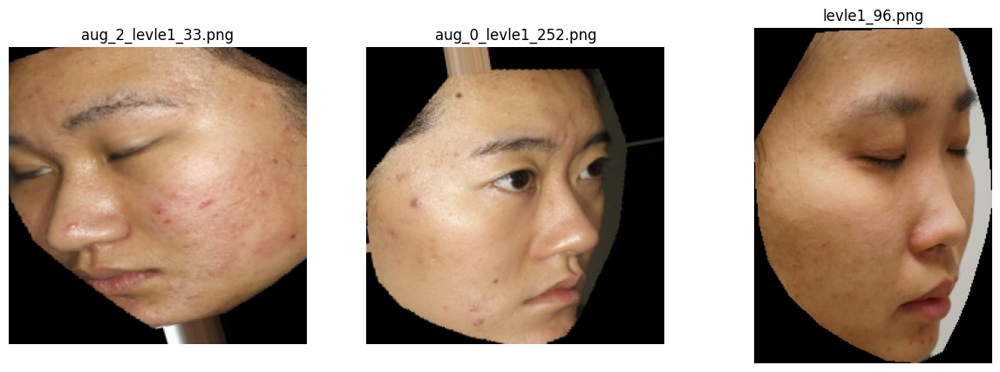

Clase: Level_2


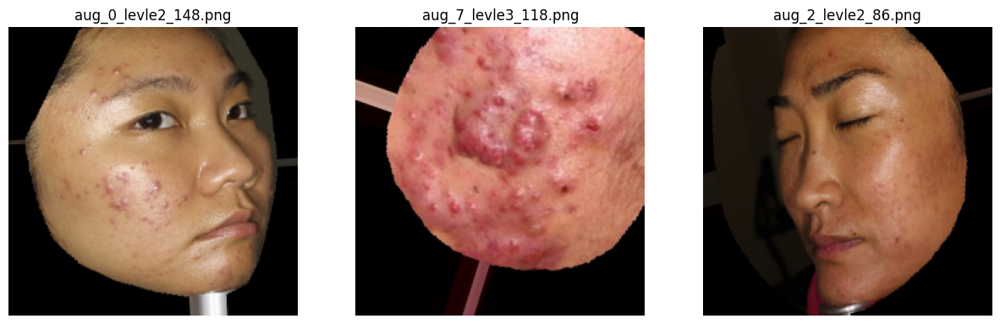

Clase: Level_0


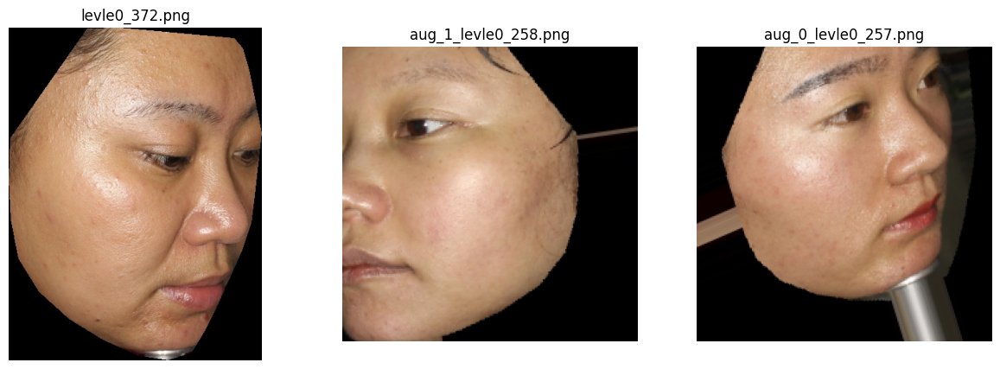

In [14]:
import os
import shutil
import random
import matplotlib.pyplot as plt
import cv2

def split_data(input_dir, output_dir, train_ratio=0.6, val_ratio=0.3, test_ratio=0.1):
    """
    Divide los datos en entrenamiento, validación y prueba manteniendo la estructura de clases.
    """
    assert abs(train_ratio + val_ratio + test_ratio - 1) < 1e-6, "La suma de los ratios debe ser 1"


    # Crear carpetas de salida para cada conjunto
    train_dir = os.path.join(output_dir, 'train')
    val_dir = os.path.join(output_dir, 'validation')
    test_dir = os.path.join(output_dir, 'test')

    for dir_path in [train_dir, val_dir, test_dir]:
        if not os.path.exists(dir_path):
            os.makedirs(dir_path)

    # Recorrer las clases
    for class_name in os.listdir(input_dir):
        class_path = os.path.join(input_dir, class_name)
        if not os.path.isdir(class_path):
            continue

        images = [f for f in os.listdir(class_path) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]
        random.shuffle(images)

        # Calcular cuántas imágenes van a cada conjunto
        train_count = int(len(images) * train_ratio)
        val_count = int(len(images) * val_ratio)

        train_images = images[:train_count]
        val_images = images[train_count:train_count + val_count]
        test_images = images[train_count + val_count:]

        # Mover las imágenes a sus respectivas carpetas
        for image_set, target_dir in zip([train_images, val_images, test_images], [train_dir, val_dir, test_dir]):
            target_class_dir = os.path.join(target_dir, class_name)
            if not os.path.exists(target_class_dir):
                os.makedirs(target_class_dir)

            for image in image_set:
                src_path = os.path.join(class_path, image)
                dst_path = os.path.join(target_class_dir, image)
                shutil.copy(src_path, dst_path)

    print("Datos divididos en conjuntos de entrenamiento, validación y prueba.")

def display_samples(data_dir, num_samples=3):
    """
    Muestra muestras de cada clase en el conjunto de datos.
    """
    for class_name in os.listdir(data_dir):
        class_path = os.path.join(data_dir, class_name)
        if not os.path.isdir(class_path):
            continue

        print(f"Clase: {class_name}")
        images = [f for f in os.listdir(class_path) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]
        samples = random.sample(images, min(num_samples, len(images)))

        # Mostrar imágenes
        fig, axes = plt.subplots(1, len(samples), figsize=(15, 5))
        for i, image in enumerate(samples):
            img_path = os.path.join(class_path, image)
            img = cv2.imread(img_path)
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            axes[i].imshow(img_rgb)
            axes[i].axis('off')
            axes[i].set_title(image)
        plt.show()

# Directorios
input_dir = '/kaggle/working/datacreate'
output_dir = '/kaggle/working/DTTYV'

# Dividir datos y mostrar muestras
split_data(input_dir, output_dir)
display_samples(os.path.join(output_dir, 'train'))

In [15]:
import os

def contar_imagenes_en_carpeta(root_dir, extensiones_validas=('.jpg', '.jpeg', '.png', '.bmp')):
    """
    Cuenta cuántas imágenes hay en cada carpeta dentro de un directorio raíz.
    
    Parámetros:
    - root_dir: Directorio raíz donde están las carpetas de imágenes.
    - extensiones_validas: Extensiones de archivo que se consideran imágenes.
    
    Retorna:
    - Un diccionario con la carpeta como clave y el número de imágenes como valor.
    """
    conteo_imagenes = {}
    for carpeta in os.listdir(root_dir):
        carpeta_path = os.path.join(root_dir, carpeta)
        if os.path.isdir(carpeta_path):
            archivos = [f for f in os.listdir(carpeta_path) if f.lower().endswith(extensiones_validas)]
            conteo_imagenes[carpeta] = len(archivos)
    return conteo_imagenes
print("Imagenes test:")
# Directorio raíz
directorio = '/kaggle/working/DTTYV/test'

# Obtener el conteo de imágenes
conteo = contar_imagenes_en_carpeta(directorio)

# Mostrar el resultado
for carpeta, num_imagenes in conteo.items():
    print(f"Carpeta: {carpeta}, Número de imágenes: {num_imagenes}")

print("Imagenes validacion:")
# Directorio raíz
directorio = '/kaggle/working/DTTYV/validation'

# Obtener el conteo de imágenes
conteo = contar_imagenes_en_carpeta(directorio)

# Mostrar el resultado
for carpeta, num_imagenes in conteo.items():
    print(f"Carpeta: {carpeta}, Número de imágenes: {num_imagenes}")

print("Imagenes entrenamiento:")
# Directorio raíz
directorio = '/kaggle/working/DTTYV/train'

# Obtener el conteo de imágenes
conteo = contar_imagenes_en_carpeta(directorio)

# Mostrar el resultado
for carpeta, num_imagenes in conteo.items():
    print(f"Carpeta: {carpeta}, Número de imágenes: {num_imagenes}")

Imagenes test:
Carpeta: Level_1, Número de imágenes: 190
Carpeta: Level_2, Número de imágenes: 181
Carpeta: Level_0, Número de imágenes: 194
Imagenes validacion:
Carpeta: Level_1, Número de imágenes: 567
Carpeta: Level_2, Número de imágenes: 542
Carpeta: Level_0, Número de imágenes: 580
Imagenes entrenamiento:
Carpeta: Level_1, Número de imágenes: 1135
Carpeta: Level_2, Número de imágenes: 1084
Carpeta: Level_0, Número de imágenes: 1161


In [16]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Generador para entrenamiento con augmentación
train_datagen = ImageDataGenerator(
    rescale=1/255,
    rotation_range=10,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    zoom_range=0.15,
    horizontal_flip=True,
    fill_mode="nearest"
)

# Generador para validación y prueba (sin augmentación)
val_test_datagen = ImageDataGenerator(rescale=1/255)

# Generador de entrenamiento
train_generator = train_datagen.flow_from_directory(
    './DTTYV/train',
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    color_mode='rgb',
    shuffle=True
)

# Generador de validación
validation_generator = val_test_datagen.flow_from_directory(
    './DTTYV/validation',
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    color_mode='rgb',
    shuffle=True
)

test_datagen = ImageDataGenerator(rescale=1/255)
# Generador de prueba
test_generator = test_datagen.flow_from_directory(
    './DTTYV/test',
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False  # Importante para mantener el orden
)

Found 3380 images belonging to 3 classes.
Found 1689 images belonging to 3 classes.
Found 565 images belonging to 3 classes.


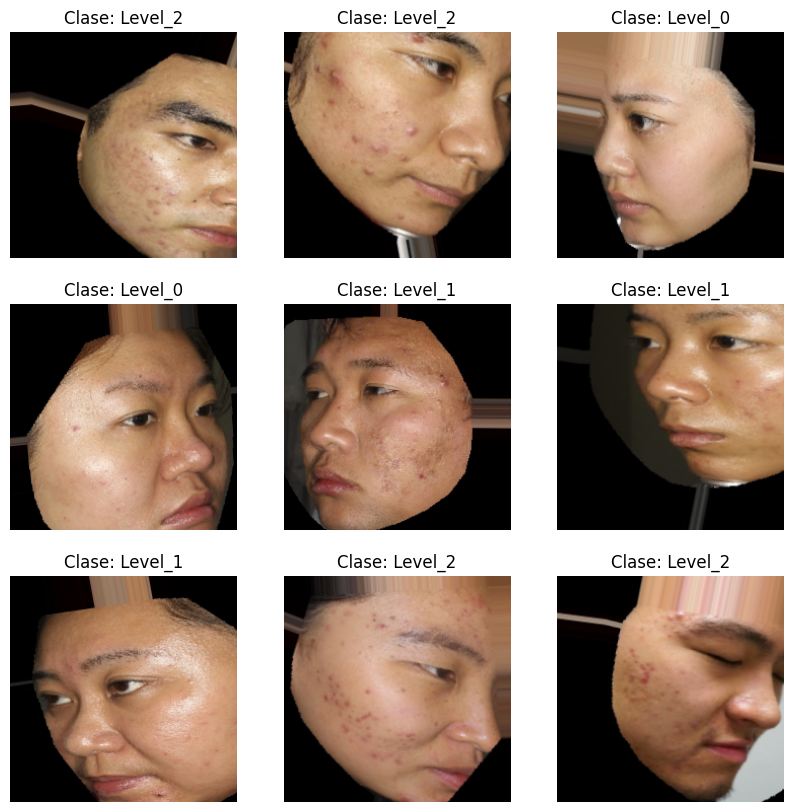

In [17]:
images, labels = next(train_generator)

plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i+1)
    plt.imshow(images[i])
    class_idx = np.argmax(labels[i])
    class_name = list(train_generator.class_indices.keys())[class_idx]
    plt.title(f"Clase: {class_name}")
    plt.axis('off')
plt.show()

### **Modelo Propuesto**

In [18]:
from tensorflow.keras.layers import (
    Input, Conv2D, BatchNormalization, MaxPooling2D, GlobalAveragePooling2D,
    Dense, Dropout, Add, Activation
)
from tensorflow.keras.models import Model
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import Adam

# Bloque residual con Batch Normalization
def residual_block(x, filters, kernel_size=(3, 3), stride=(1, 1), activation='relu'):
    shortcut = x
    x = Conv2D(filters, kernel_size, strides=stride, padding='same', kernel_regularizer=l2(0.01))(x)
    x = BatchNormalization()(x)
    x = Activation(activation)(x)
    x = Conv2D(filters, kernel_size, strides=(1, 1), padding='same', kernel_regularizer=l2(0.01))(x)
    x = BatchNormalization()(x)
    
    # Alinear el shortcut si la cantidad de filtros cambia
    if shortcut.shape[-1] != filters:
        shortcut = Conv2D(filters, (1, 1), strides=stride, padding='same', kernel_regularizer=l2(0.01))(shortcut)
    
    x = Add()([x, shortcut])
    x = Activation(activation)(x)
    return x

# Construcción del modelo
input_img = Input(shape=(224, 224, 3))

# Bloque inicial
x = Conv2D(32, (3, 3), activation='relu', padding='same', kernel_regularizer=l2(0.01))(input_img)
x = BatchNormalization()(x)
x = MaxPooling2D((2, 2))(x)

# Bloques residuales
x = residual_block(x, 64)
x = MaxPooling2D((2, 2))(x)
x = residual_block(x, 128)
x = MaxPooling2D((2, 2))(x)
x = residual_block(x, 256)
x = MaxPooling2D((2, 2))(x)

# Extracción de características globales
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu', kernel_regularizer=l2(0.01))(x)
x = Dropout(0.5)(x)
x = Dense(128, activation='relu', kernel_regularizer=l2(0.01))(x)
x = Dropout(0.5)(x)

# Capa de salida
output = Dense(3, activation='softmax')(x)

model = Model(inputs=input_img, outputs=output)

# Compilación del modelo
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

# Resumen del modelo
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 224, 224,  │        896 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 224, 224,  │        128 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 112, 112,  │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 112, 112,  │     18,496 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 112, 112,  │        256 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 112, 112,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 112, 112,  │     36,928 │ activation[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 112, 112,  │        256 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 112, 112,  │      2,112 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 112, 112,  │          0 │ batch_normalizat… │
│                     │ 64)               │            │ conv2d_3[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 112, 112,  │          0 │ add[0][0]         │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 56, 56,    │          0 │ activation_1[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 56, 56,    │     73,856 │ max_pooling2d_1[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 56, 56,    │        512 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 56, 56,    │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 56, 56,    │    147,584 │ activation_2[0][

 Total params: 1,309,251 (4.99 MB)

 Trainable params: 1,307,395 (4.99 MB)

 Non-trainable params: 1,856 (7.25 KB)

In [19]:
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping, TensorBoard, CSVLogger
import datetime

# Directorio para guardar modelos
checkpoint_dir = "./checkpoints"
os.makedirs(checkpoint_dir, exist_ok=True)

# Callbacks
callbacks = [
    ModelCheckpoint(
        filepath=os.path.join(checkpoint_dir, "best_model.keras"),
        monitor="val_accuracy",
        save_best_only=True,
        mode="max",
        verbose=1
    ),
    ReduceLROnPlateau(
        monitor="val_accuracy",
        factor=0.5,
        patience=5,
        verbose=1,
        mode="max",
        min_lr=1e-6
    ),
    EarlyStopping(
        monitor="val_accuracy",
        patience=20,
        verbose=1,
        mode="max",
        restore_best_weights=True
    )
]

# Entrenamiento del modelo
history = model.fit(
    train_generator,
    validation_data=validation_generator,  # Asegúrate de definir val_data como el conjunto de validación
    epochs=200,
    callbacks=callbacks
)

Epoch 1/200


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1733444349.994060     232 service.cc:145] XLA service 0x7c84440041e0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733444349.994112     232 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1733444349.994116     232 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5


  1/106 ━━━━━━━━━━━━━━━━━━━━ 46:52 27s/step - accuracy: 0.1875 - loss: 16.7632

I0000 00:00:1733444368.533857     232 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


106/106 ━━━━━━━━━━━━━━━━━━━━ 0s 464ms/step - accuracy: 0.3881 - loss: 12.0344
Epoch 1: val_accuracy improved from -inf to 0.32090, saving model to ./checkpoints/best_model.keras
106/106 ━━━━━━━━━━━━━━━━━━━━ 86s 561ms/step - accuracy: 0.3882 - loss: 12.0035 - val_accuracy: 0.3209 - val_loss: 4.2036 - learning_rate: 0.0010
Epoch 2/200
106/106 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step - accuracy: 0.4132 - loss: 3.4777
Epoch 2: val_accuracy did not improve from 0.32090
106/106 ━━━━━━━━━━━━━━━━━━━━ 45s 400ms/step - accuracy: 0.4132 - loss: 3.4728 - val_accuracy: 0.3209 - val_loss: 2.1613 - learning_rate: 0.0010
Epoch 3/200
106/106 ━━━━━━━━━━━━━━━━━━━━ 0s 352ms/step - accuracy: 0.3983 - loss: 1.9345
Epoch 3: val_accuracy did not improve from 0.32090
106/106 ━━━━━━━━━━━━━━━━━━━━ 45s 400ms/step - accuracy: 0.3985 - loss: 1.9330 - val_accuracy: 0.3209 - val_loss: 1.6071 - learning_rate: 0.0010
Epoch 4/200
106/106 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step - accuracy: 0.4092 - loss: 1.4684
Epoch 4: val_accurac

53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - accuracy: 0.8098 - loss: 0.5105
Precisión en validacion: 80.17%


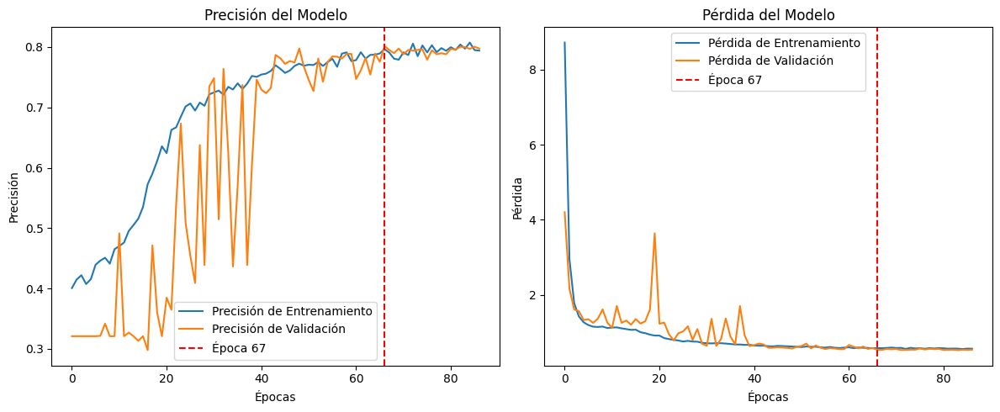

In [21]:
loss, accuracy = model.evaluate(validation_generator)
print(f"Precisión en validacion: {accuracy * 100:.2f}%")
# Gráfica de precisión
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Precisión de Entrenamiento')
plt.plot(history.history['val_accuracy'], label='Precisión de Validación')
plt.axvline(x=67 - 1, color='red', linestyle='--', label=f'Época {67}')
plt.title('Precisión del Modelo')
plt.xlabel('Épocas')
plt.ylabel('Precisión')
plt.legend()

# Gráfica de pérdida
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Pérdida de Entrenamiento')
plt.plot(history.history['val_loss'], label='Pérdida de Validación')
plt.axvline(x=67 - 1, color='red', linestyle='--', label=f'Época {67}')
plt.title('Pérdida del Modelo')
plt.xlabel('Épocas')
plt.ylabel('Pérdida')
plt.legend()

plt.tight_layout()
plt.show()

53/53 ━━━━━━━━━━━━━━━━━━━━ 6s 104ms/step


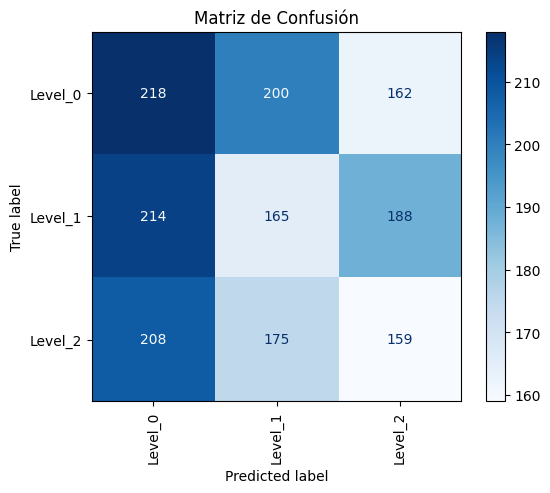

In [22]:
import numpy as np

# Obtener predicciones del modelo
y_pred = model.predict(validation_generator)
y_pred_classes = np.argmax(y_pred, axis=1)  # Convertir a índices de clases

# Etiquetas verdaderas
y_true = validation_generator.classes

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Etiquetas de clase
class_labels = list(validation_generator.class_indices.keys())  # Nombres de las clases

# Generar matriz de confusión
conf_matrix = confusion_matrix(y_true, y_pred_classes)

# Visualizar la matriz de confusión
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=class_labels)
disp.plot(cmap='Blues', xticks_rotation='vertical')
plt.title('Matriz de Confusión')
plt.show()

In [23]:
from sklearn.metrics import classification_report
# Etiquetas verdaderas
y_true = validation_generator.classes  # Extrae etiquetas verdaderas del generador

# Predicciones del modelo
import numpy as np
y_pred_probs = model.predict(validation_generator)  # Predicciones como probabilidades
y_pred = np.argmax(y_pred_probs, axis=1)  # Convierte probabilidades en etiquetas

# Ejemplo
print(classification_report(
    y_true,
    y_pred,
    labels=None,  # Puedes especificar etiquetas específicas si es necesario
    target_names=None,  # Opcional: nombres de las clases
    sample_weight=None,  # Pesos opcionales para las muestras
    digits=4,  # Precisión decimal
    output_dict=False,  # Cambia a True si quieres el resultado como un diccionario
    zero_division='warn'  # Cómo manejar divisiones por cero
))

53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 101ms/step
              precision    recall  f1-score   support

           0     0.3203    0.3534    0.3361       580
           1     0.3389    0.3228    0.3306       567
           2     0.3281    0.3081    0.3178       542

    accuracy                         0.3286      1689
   macro avg     0.3291    0.3281    0.3282      1689
weighted avg     0.3290    0.3286    0.3284      1689



53/53 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step


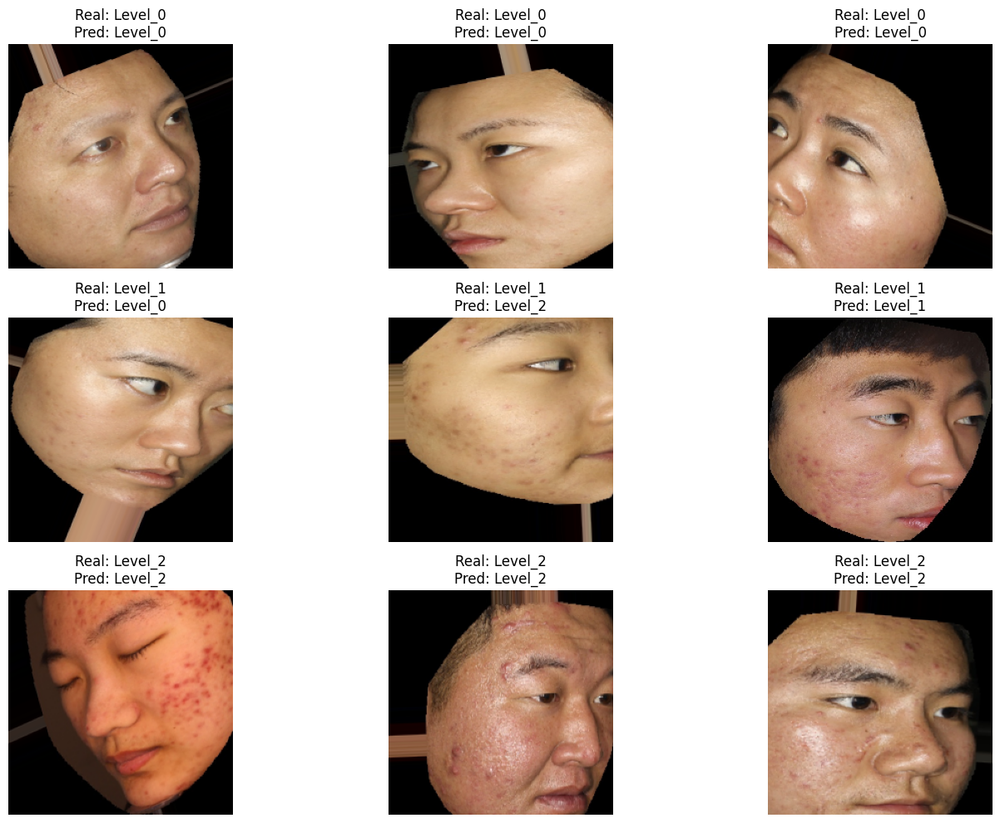

In [47]:
import os
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Rutas de las carpetas de validación
base_dir = "/kaggle/working/DTTYV/validation"
class_names = sorted(os.listdir(base_dir))  # Nombres de las carpetas (clases)

# Función para cargar imágenes
def load_images_and_labels(base_dir, class_names):
    images, labels, file_paths = [], [], []
    for label, class_name in enumerate(class_names):
        class_dir = os.path.join(base_dir, class_name)
        for img_name in os.listdir(class_dir):
            img_path = os.path.join(class_dir, img_name)
            images.append(img_path)
            labels.append(label)
            file_paths.append(img_path)
    return images, labels, file_paths

# Cargar imágenes y etiquetas verdaderas
image_paths, y_true, file_paths = load_images_and_labels(base_dir, class_names)

# Obtener predicciones del modelo
y_pred_probs = model.predict(np.array([img_to_array(load_img(img_path, target_size=(224, 224))) / 255.0 for img_path in image_paths]))
y_pred = np.argmax(y_pred_probs, axis=1)

# Seleccionar 3 imágenes por clase
selected_images = {class_name: [] for class_name in class_names}
for img_path, true_label, pred_label in zip(image_paths, y_true, y_pred):
    if len(selected_images[class_names[true_label]]) < 3:
        selected_images[class_names[true_label]].append((img_path, pred_label))

# Graficar las imágenes
fig, axes = plt.subplots(len(class_names), 3, figsize=(15, 10))

for i, class_name in enumerate(class_names):
    for j, (img_path, pred_label) in enumerate(selected_images[class_name]):
        img = load_img(img_path, target_size=(224, 224))  # Cargar imagen
        ax = axes[i, j]
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(f"Real: {class_name}\nPred: {class_names[pred_label]}")

plt.tight_layout()
plt.show()


Carpeta ya existe: /kaggle/working/Fotos/
Gráfico guardado en: /kaggle/working/Fotos/modelopredicciones.png


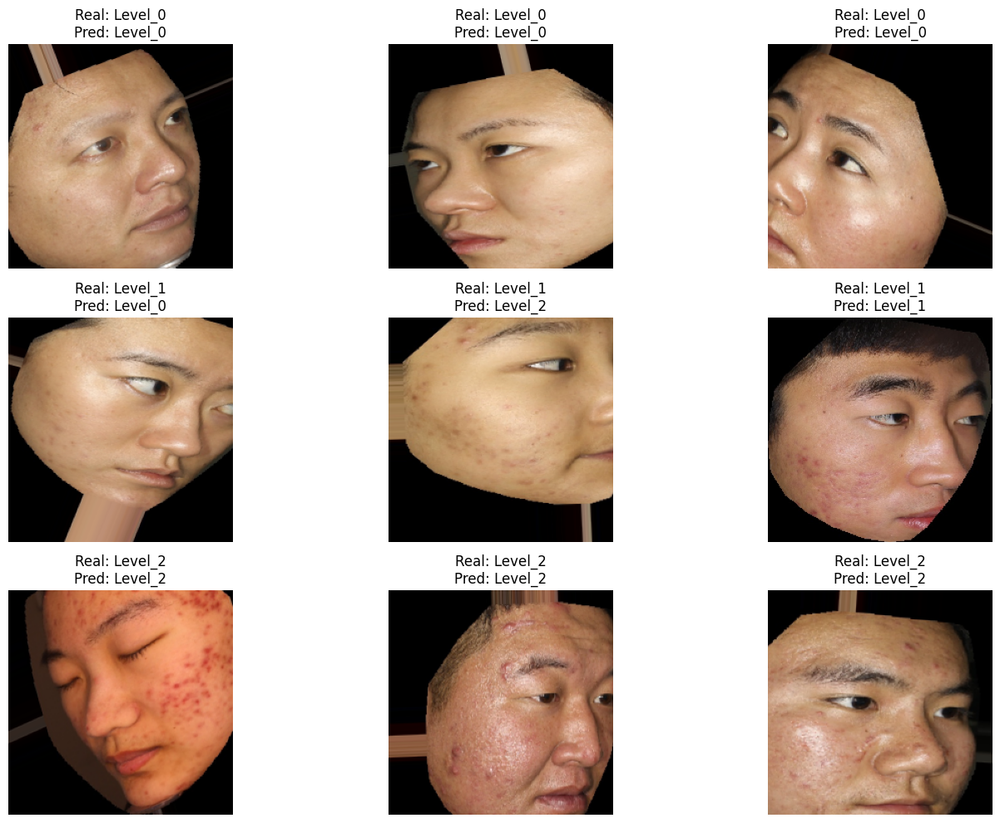

In [48]:
import os
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img

# Rutas de las carpetas de validación
base_dir = "/kaggle/working/DTTYV/validation"
# Ruta de la carpeta donde se guardará la imagen
output_dir = "/kaggle/working/Fotos/"
output_path = os.path.join(output_dir, "modelopredicciones.png")

# Verificar si la carpeta existe, si no, crearla
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
    print(f"Carpeta creada: {output_dir}")
else:
    print(f"Carpeta ya existe: {output_dir}")

# Crear subplots como antes
fig, axes = plt.subplots(len(class_names), 3, figsize=(15, 10))

for i, class_name in enumerate(class_names):
    for j, (img_path, pred_label) in enumerate(selected_images[class_name]):
        img = load_img(img_path, target_size=(224, 224))  # Cargar imagen
        ax = axes[i, j]
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(f"Real: {class_name}\nPred: {class_names[pred_label]}")

# Ajustar diseño
plt.tight_layout()

# Guardar el plot como una imagen
fig.savefig(output_path, dpi=300)  # Guarda con alta resolución (300 DPI)

print(f"Gráfico guardado en: {output_path}")

### **Modelo EfficientNetB7**

In [24]:
from tensorflow.keras.applications import EfficientNetB7
from tensorflow.keras.layers import Input, GlobalAveragePooling2D, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.applications.efficientnet import preprocess_input

# Cargar el modelo base EfficientNetB7 sin la capa superior
base_model = EfficientNetB7(
    include_top=False,
    weights='imagenet',
    input_shape=(224, 224, 3)
)

# Congelar las capas del modelo preentrenado (evitar que se entrenen)
base_model.trainable = False

# Construcción del modelo
input_img = Input(shape=(224, 224, 3))

# Preprocesar las imágenes de entrada
x = preprocess_input(input_img)

# Usar el modelo base (EfficientNetB7) como parte del nuevo modelo
x = base_model(x)

# Extracción de características globales
x = GlobalAveragePooling2D()(x)

# Capa de salida
output = Dense(3, activation='softmax')(x)  # Asumiendo que son 3 clases

# Crear el modelo final
model1 = Model(inputs=input_img, outputs=output)
model1.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])
# Resumen del modelo
model1.summary()

from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping, TensorBoard, CSVLogger
import datetime

# Directorio para guardar modelos
checkpoint_dir = "./checkpoints"
os.makedirs(checkpoint_dir, exist_ok=True)

# Callbacks
callbacks = [
    ReduceLROnPlateau(
        monitor="val_accuracy",
        factor=0.5,
        patience=5,
        verbose=1,
        mode="max",
        min_lr=1e-6
    ),
    EarlyStopping(
        monitor="val_accuracy",
        patience=10,
        verbose=1,
        mode="max",
        restore_best_weights=True
    )
]

# Entrenamiento del modelo
history1 = model1.fit(
    train_generator,
    validation_data=validation_generator,  # Asegúrate de definir val_data como el conjunto de validación
    epochs=100,
    callbacks=callbacks
)

258076736/258076736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb7 (Functional)     │ (None, 7, 7, 2560)     │    64,097,687 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 2560)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 3)              │         7,683 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 64,105,370 (244.54 MB)

 Trainable params: 7,683 (30.01 KB)

 Non-trainable params: 64,097,687 (244.51 MB)

Epoch 1/100
106/106 ━━━━━━━━━━━━━━━━━━━━ 295s 2s/step - accuracy: 0.3284 - loss: 1.1400 - val_accuracy: 0.3357 - val_loss: 1.1158 - learning_rate: 0.0010
Epoch 2/100
106/106 ━━━━━━━━━━━━━━━━━━━━ 55s 497ms/step - accuracy: 0.3193 - loss: 1.1181 - val_accuracy: 0.3434 - val_loss: 1.1191 - learning_rate: 0.0010
Epoch 3/100
106/106 ━━━━━━━━━━━━━━━━━━━━ 55s 494ms/step - accuracy: 0.3438 - loss: 1.1109 - val_accuracy: 0.3434 - val_loss: 1.1049 - learning_rate: 0.0010
Epoch 4/100
106/106 ━━━━━━━━━━━━━━━━━━━━ 56s 505ms/step - accuracy: 0.3196 - loss: 1.1208 - val_accuracy: 0.3434 - val_loss: 1.1076 - learning_rate: 0.0010
Epoch 5/100
106/106 ━━━━━━━━━━━━━━━━━━━━ 55s 497ms/step - accuracy: 0.3354 - loss: 1.1191 - val_accuracy: 0.3434 - val_loss: 1.1127 - learning_rate: 0.0010
Epoch 6/100
106/106 ━━━━━━━━━━━━━━━━━━━━ 55s 493ms/step - accuracy: 0.3317 - loss: 1.1152 - val_accuracy: 0.3434 - val_loss: 1.1012 - learning_rate: 0.0010
Epoch 7/100
106/106 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step - accuracy:

53/53 ━━━━━━━━━━━━━━━━━━━━ 12s 218ms/step - accuracy: 0.3605 - loss: 1.1131
Precisión en validacion: 34.34%


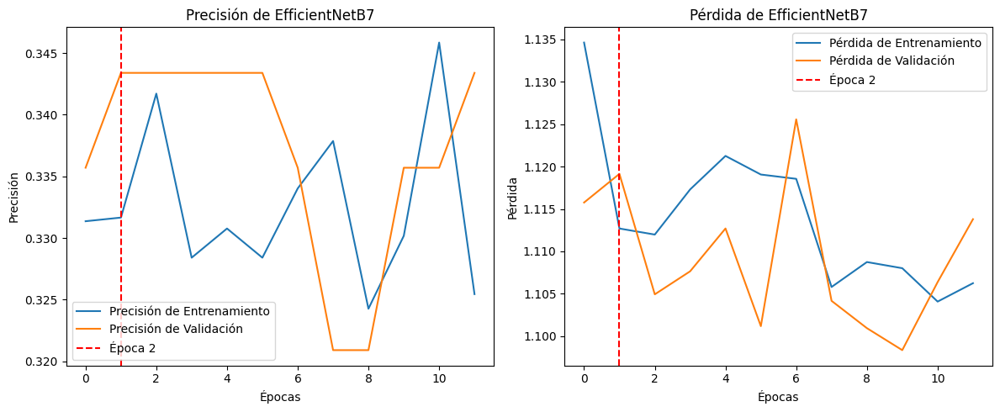

In [49]:
loss, accuracy = model1.evaluate(validation_generator)
print(f"Precisión en validacion: {accuracy * 100:.2f}%")
# Gráfica de precisión
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history1.history['accuracy'], label='Precisión de Entrenamiento')
plt.plot(history1.history['val_accuracy'], label='Precisión de Validación')
plt.axvline(x=2 - 1, color='red', linestyle='--', label=f'Época {2}')
plt.title('Precisión de EfficientNetB7')
plt.xlabel('Épocas')
plt.ylabel('Precisión')
plt.legend()

# Gráfica de pérdida
plt.subplot(1, 2, 2)
plt.plot(history1.history['loss'], label='Pérdida de Entrenamiento')
plt.plot(history1.history['val_loss'], label='Pérdida de Validación')
plt.axvline(x=2 - 1, color='red', linestyle='--', label=f'Época {2}')
plt.title('Pérdida de EfficientNetB7')
plt.xlabel('Épocas')
plt.ylabel('Pérdida')
plt.legend()

plt.tight_layout()
plt.show()

53/53 ━━━━━━━━━━━━━━━━━━━━ 36s 452ms/step


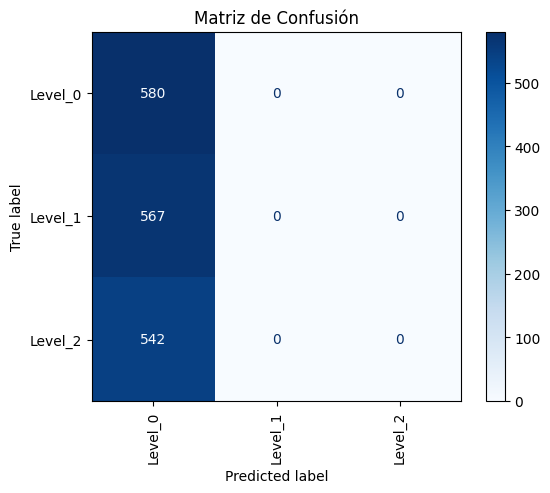

In [26]:
import numpy as np

# Obtener predicciones del modelo
y_pred = model1.predict(validation_generator)
y_pred_classes = np.argmax(y_pred, axis=1)  # Convertir a índices de clases

# Etiquetas verdaderas
y_true = validation_generator.classes

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Etiquetas de clase
class_labels = list(validation_generator.class_indices.keys())  # Nombres de las clases

# Generar matriz de confusión
conf_matrix = confusion_matrix(y_true, y_pred_classes)

# Visualizar la matriz de confusión
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=class_labels)
disp.plot(cmap='Blues', xticks_rotation='vertical')
plt.title('Matriz de Confusión')
plt.show()

In [30]:
from sklearn.metrics import classification_report
# Etiquetas verdaderas
y_true = validation_generator.classes  # Extrae etiquetas verdaderas del generador

# Predicciones del modelo
import numpy as np
y_pred_probs = model1.predict(validation_generator)  # Predicciones como probabilidades
y_pred = np.argmax(y_pred_probs, axis=1)  # Convierte probabilidades en etiquetas

# Ejemplo
print(classification_report(
    y_true,
    y_pred,
    labels=None,  # Puedes especificar etiquetas específicas si es necesario
    target_names=None,  # Opcional: nombres de las clases
    sample_weight=None,  # Pesos opcionales para las muestras
    digits=4,  # Precisión decimal
    output_dict=False,  # Cambia a True si quieres el resultado como un diccionario
    zero_division='warn'  # Cómo manejar divisiones por cero
))

53/53 ━━━━━━━━━━━━━━━━━━━━ 12s 223ms/step
              precision    recall  f1-score   support

           0     0.3434    1.0000    0.5112       580
           1     0.0000    0.0000    0.0000       567
           2     0.0000    0.0000    0.0000       542

    accuracy                         0.3434      1689
   macro avg     0.1145    0.3333    0.1704      1689
weighted avg     0.1179    0.3434    0.1756      1689



/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


53/53 ━━━━━━━━━━━━━━━━━━━━ 33s 426ms/step


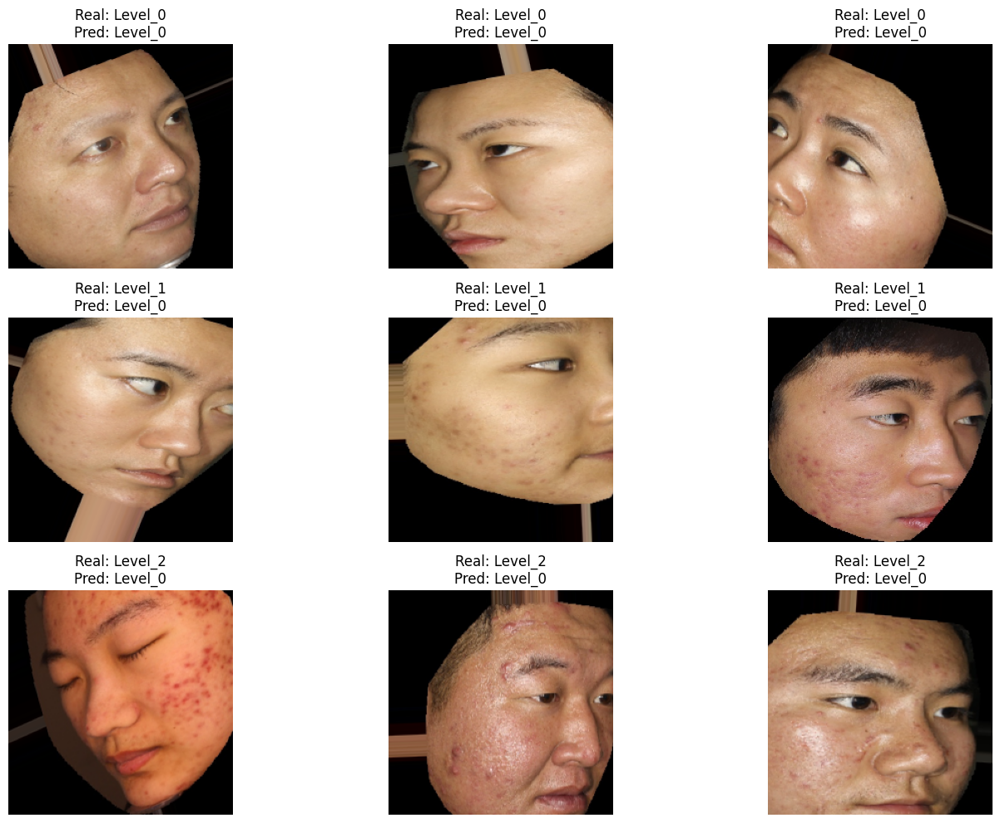

In [42]:
import os
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Rutas de las carpetas de validación
base_dir = "/kaggle/working/DTTYV/validation"
class_names = sorted(os.listdir(base_dir))  # Nombres de las carpetas (clases)

# Función para cargar imágenes
def load_images_and_labels(base_dir, class_names):
    images, labels, file_paths = [], [], []
    for label, class_name in enumerate(class_names):
        class_dir = os.path.join(base_dir, class_name)
        for img_name in os.listdir(class_dir):
            img_path = os.path.join(class_dir, img_name)
            images.append(img_path)
            labels.append(label)
            file_paths.append(img_path)
    return images, labels, file_paths

# Cargar imágenes y etiquetas verdaderas
image_paths, y_true, file_paths = load_images_and_labels(base_dir, class_names)

# Obtener predicciones del modelo
y_pred_probs = model1.predict(np.array([img_to_array(load_img(img_path, target_size=(224, 224))) / 255.0 for img_path in image_paths]))
y_pred = np.argmax(y_pred_probs, axis=1)

# Seleccionar 3 imágenes por clase
selected_images = {class_name: [] for class_name in class_names}
for img_path, true_label, pred_label in zip(image_paths, y_true, y_pred):
    if len(selected_images[class_names[true_label]]) < 3:
        selected_images[class_names[true_label]].append((img_path, pred_label))

# Graficar las imágenes
fig, axes = plt.subplots(len(class_names), 3, figsize=(15, 10))

for i, class_name in enumerate(class_names):
    for j, (img_path, pred_label) in enumerate(selected_images[class_name]):
        img = load_img(img_path, target_size=(224, 224))  # Cargar imagen
        ax = axes[i, j]
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(f"Real: {class_name}\nPred: {class_names[pred_label]}")

plt.tight_layout()
plt.show()


Carpeta creada: /kaggle/working/Fotos/
Gráfico guardado en: /kaggle/working/Fotos/modelo1predicciones.png


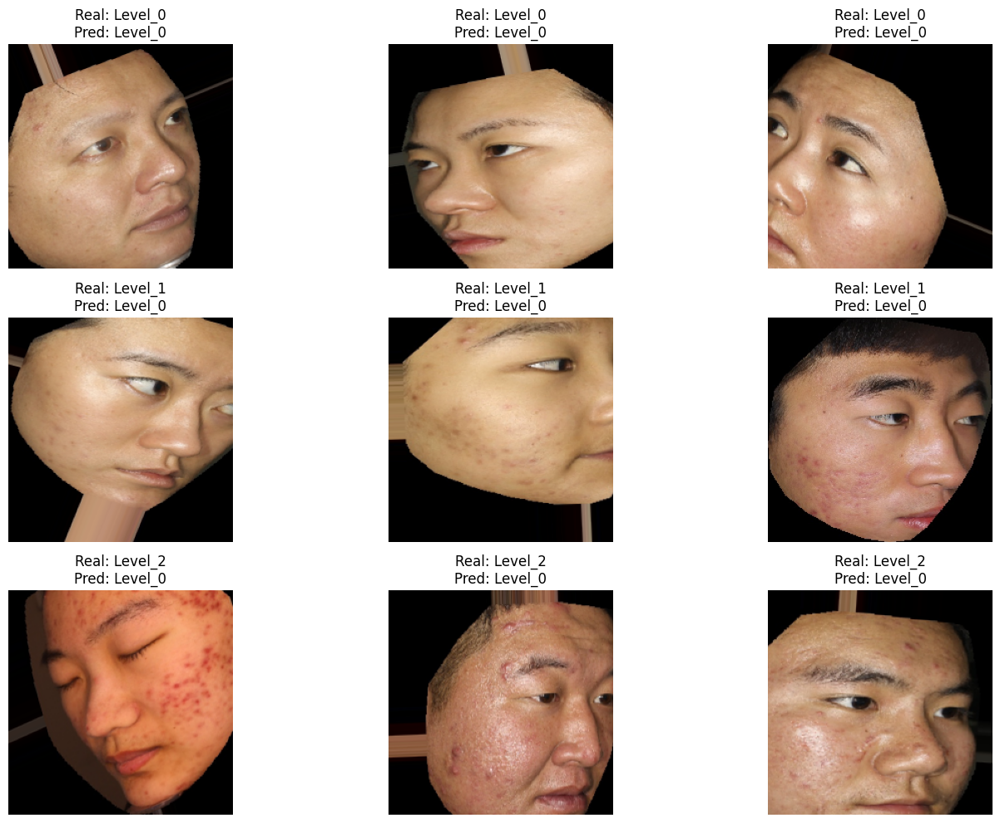

In [44]:
import os
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img

# Rutas de las carpetas de validación
base_dir = "/kaggle/working/DTTYV/validation"
# Ruta de la carpeta donde se guardará la imagen
output_dir = "/kaggle/working/Fotos/"
output_path = os.path.join(output_dir, "modelo1predicciones.png")

# Verificar si la carpeta existe, si no, crearla
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
    print(f"Carpeta creada: {output_dir}")
else:
    print(f"Carpeta ya existe: {output_dir}")

# Crear subplots como antes
fig, axes = plt.subplots(len(class_names), 3, figsize=(15, 10))

for i, class_name in enumerate(class_names):
    for j, (img_path, pred_label) in enumerate(selected_images[class_name]):
        img = load_img(img_path, target_size=(224, 224))  # Cargar imagen
        ax = axes[i, j]
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(f"Real: {class_name}\nPred: {class_names[pred_label]}")

# Ajustar diseño
plt.tight_layout()

# Guardar el plot como una imagen
fig.savefig(output_path, dpi=300)  # Guarda con alta resolución (300 DPI)

print(f"Gráfico guardado en: {output_path}")


### **Modelo ResNet50**

In [31]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Input, GlobalAveragePooling2D, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.applications.resnet50 import preprocess_input

# Cargar el modelo base ResNet50 sin la capa superior (include_top=False)
base_model = ResNet50(
    include_top=False,
    weights='imagenet',
    input_shape=(224, 224, 3)
)

# Congelar las capas del modelo preentrenado (evitar que se entrenen)
base_model.trainable = False

# Construcción del modelo
input_img = Input(shape=(224, 224, 3))

# Preprocesar las imágenes de entrada
x = preprocess_input(input_img)

# Usar el modelo base (ResNet50) como parte del nuevo modelo
x = base_model(x)

# Extracción de características globales
x = GlobalAveragePooling2D()(x)

# Capa de salida
output = Dense(3, activation='softmax')(x)  # Asumiendo que son 3 clases

# Crear el modelo final
model2 = Model(inputs=input_img, outputs=output)
model2.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])
# Resumen del modelo
model2.summary()

from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping, TensorBoard, CSVLogger
import datetime

# Directorio para guardar modelos
checkpoint_dir = "./checkpoints"
os.makedirs(checkpoint_dir, exist_ok=True)

# Callbacks
callbacks = [
    # ModelCheckpoint(
    #     filepath=os.path.join(checkpoint_dir, "best_model.h5"),
    #     monitor="val_accuracy",
    #     save_best_only=True,
    #     mode="max",
    #     verbose=1
    # ),
    ReduceLROnPlateau(
        monitor="val_accuracy",
        factor=0.5,
        patience=5,
        verbose=1,
        mode="max",
        min_lr=1e-6
    ),
    EarlyStopping(
        monitor="val_accuracy",
        patience=20,
        verbose=1,
        mode="max",
        restore_best_weights=True
    )
]

# Entrenamiento del modelo
history2 = model2.fit(
    train_generator,
    validation_data=validation_generator,  # Asegúrate de definir val_data como el conjunto de validación
    epochs=100,
    callbacks=callbacks
)

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item (GetItem)  │ (None, 224, 224)  │          0 │ input_layer_4[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_1          │ (None, 224, 224)  │          0 │ input_layer_4[0]… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_2          │ (None, 224, 224)  │          0 │ input_layer_4[0]… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stack (Stack)       │ (None, 224, 224,  │          0 │ get_item[0][0],   │
│                     │ 3)                │            │ get_item_1[0][0], │
│                     │                   │            │ get_item_2[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_3 (Add)         │ (None, 224, 224,  │          0 │ stack[0][0]       │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ resnet50            │ (None, 7, 7,      │ 23,587,712 │ add_3[0][0]       │
│ (Functional)        │ 2048)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 2048)      │          0 │ resnet50[0][0]    │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_4 (Dense)     │ (None, 3)         │      6,147 │ global_average_p… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 23,593,859 (90.00 MB)

 Trainable params: 6,147 (24.01 KB)

 Non-trainable params: 23,587,712 (89.98 MB)

Epoch 1/100
106/106 ━━━━━━━━━━━━━━━━━━━━ 64s 487ms/step - accuracy: 0.3249 - loss: 1.1166 - val_accuracy: 0.3209 - val_loss: 1.1163 - learning_rate: 0.0010
Epoch 2/100
106/106 ━━━━━━━━━━━━━━━━━━━━ 45s 398ms/step - accuracy: 0.3213 - loss: 1.1123 - val_accuracy: 0.3363 - val_loss: 1.1078 - learning_rate: 0.0010
Epoch 3/100
106/106 ━━━━━━━━━━━━━━━━━━━━ 44s 394ms/step - accuracy: 0.3302 - loss: 1.1109 - val_accuracy: 0.3363 - val_loss: 1.1000 - learning_rate: 0.0010
Epoch 4/100
106/106 ━━━━━━━━━━━━━━━━━━━━ 45s 397ms/step - accuracy: 0.3420 - loss: 1.1052 - val_accuracy: 0.3209 - val_loss: 1.1160 - learning_rate: 0.0010
Epoch 5/100
106/106 ━━━━━━━━━━━━━━━━━━━━ 45s 397ms/step - accuracy: 0.3249 - loss: 1.1154 - val_accuracy: 0.3523 - val_loss: 1.0991 - learning_rate: 0.0010
Epoch 6/100
106/106 ━━━━━━━━━━━━━━━━━━━━ 45s 403ms/step - accuracy: 0.3342 - loss: 1.1054 - val_accuracy: 0.3523 - val_loss: 1.1050 - learning_rate: 0.0010
Epoch 7/100
106/106 ━━━━━━━━━━━━━━━━━━━━ 45s 401ms/step - accura

53/53 ━━━━━━━━━━━━━━━━━━━━ 6s 101ms/step - accuracy: 0.3887 - loss: 1.0919
Precisión en validacion: 40.02%


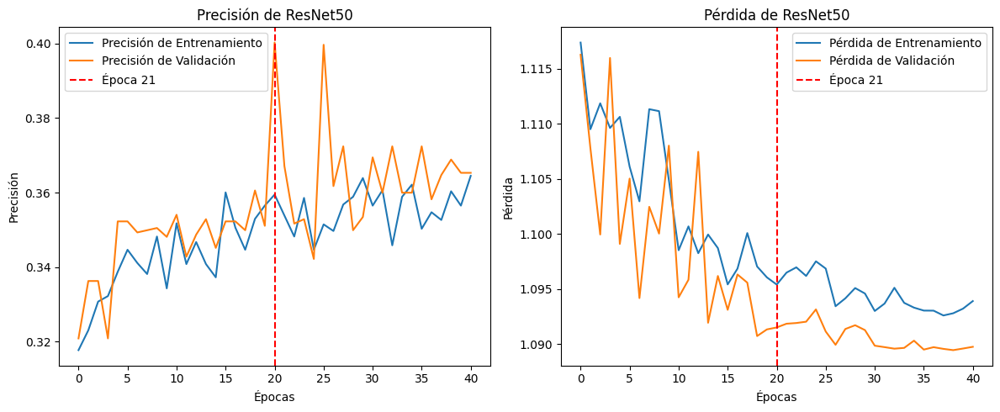

In [33]:
loss, accuracy = model2.evaluate(validation_generator)
print(f"Precisión en validacion: {accuracy * 100:.2f}%")
# Gráfica de precisión
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history2.history['accuracy'], label='Precisión de Entrenamiento')
plt.plot(history2.history['val_accuracy'], label='Precisión de Validación')
plt.axvline(x=21 - 1, color='red', linestyle='--', label=f'Época {21}')
plt.title('Precisión de ResNet50')
plt.xlabel('Épocas')
plt.ylabel('Precisión')
plt.legend()

# Gráfica de pérdida
plt.subplot(1, 2, 2)
plt.plot(history2.history['loss'], label='Pérdida de Entrenamiento')
plt.plot(history2.history['val_loss'], label='Pérdida de Validación')
plt.axvline(x=21 - 1, color='red', linestyle='--', label=f'Época {21}')
plt.title('Pérdida de ResNet50')
plt.xlabel('Épocas')
plt.ylabel('Pérdida')
plt.legend()

plt.tight_layout()
plt.show()

53/53 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step


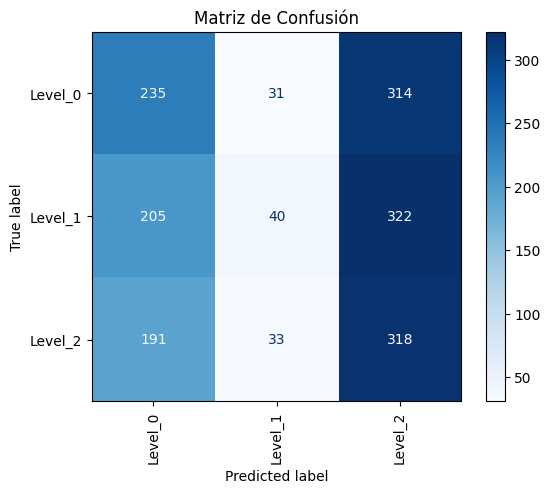

In [34]:
import numpy as np

# Obtener predicciones del modelo
y_pred = model2.predict(validation_generator)
y_pred_classes = np.argmax(y_pred, axis=1)  # Convertir a índices de clases

# Etiquetas verdaderas
y_true = validation_generator.classes

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Etiquetas de clase
class_labels = list(validation_generator.class_indices.keys())  # Nombres de las clases

# Generar matriz de confusión
conf_matrix = confusion_matrix(y_true, y_pred_classes)

# Visualizar la matriz de confusión
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=class_labels)
disp.plot(cmap='Blues', xticks_rotation='vertical')
plt.title('Matriz de Confusión')
plt.show()

In [35]:
from sklearn.metrics import classification_report
# Etiquetas verdaderas
y_true = validation_generator.classes  # Extrae etiquetas verdaderas del generador

# Predicciones del modelo
import numpy as np
y_pred_probs = model2.predict(validation_generator)  # Predicciones como probabilidades
y_pred = np.argmax(y_pred_probs, axis=1)  # Convierte probabilidades en etiquetas

# Ejemplo
print(classification_report(
    y_true,
    y_pred,
    labels=None,  # Puedes especificar etiquetas específicas si es necesario
    target_names=None,  # Opcional: nombres de las clases
    sample_weight=None,  # Pesos opcionales para las muestras
    digits=4,  # Precisión decimal
    output_dict=False,  # Cambia a True si quieres el resultado como un diccionario
    zero_division='warn'  # Cómo manejar divisiones por cero
))

53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 92ms/step
              precision    recall  f1-score   support

           0     0.3391    0.3690    0.3534       580
           1     0.2788    0.0511    0.0864       567
           2     0.3354    0.5904    0.4278       542

    accuracy                         0.3333      1689
   macro avg     0.3178    0.3368    0.2892      1689
weighted avg     0.3177    0.3333    0.2877      1689



53/53 ━━━━━━━━━━━━━━━━━━━━ 9s 126ms/step


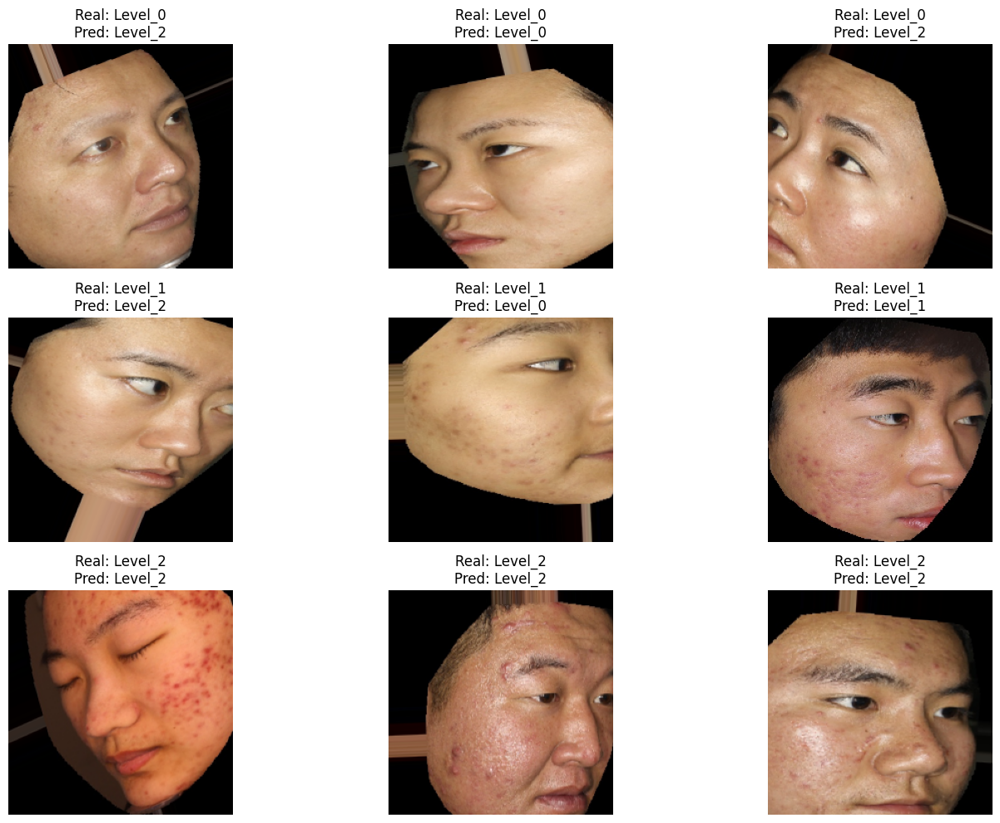

In [45]:
import os
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Rutas de las carpetas de validación
base_dir = "/kaggle/working/DTTYV/validation"
class_names = sorted(os.listdir(base_dir))  # Nombres de las carpetas (clases)

# Función para cargar imágenes
def load_images_and_labels(base_dir, class_names):
    images, labels, file_paths = [], [], []
    for label, class_name in enumerate(class_names):
        class_dir = os.path.join(base_dir, class_name)
        for img_name in os.listdir(class_dir):
            img_path = os.path.join(class_dir, img_name)
            images.append(img_path)
            labels.append(label)
            file_paths.append(img_path)
    return images, labels, file_paths

# Cargar imágenes y etiquetas verdaderas
image_paths, y_true, file_paths = load_images_and_labels(base_dir, class_names)

# Obtener predicciones del modelo
y_pred_probs = model2.predict(np.array([img_to_array(load_img(img_path, target_size=(224, 224))) / 255.0 for img_path in image_paths]))
y_pred = np.argmax(y_pred_probs, axis=1)

# Seleccionar 3 imágenes por clase
selected_images = {class_name: [] for class_name in class_names}
for img_path, true_label, pred_label in zip(image_paths, y_true, y_pred):
    if len(selected_images[class_names[true_label]]) < 3:
        selected_images[class_names[true_label]].append((img_path, pred_label))

# Graficar las imágenes
fig, axes = plt.subplots(len(class_names), 3, figsize=(15, 10))

for i, class_name in enumerate(class_names):
    for j, (img_path, pred_label) in enumerate(selected_images[class_name]):
        img = load_img(img_path, target_size=(224, 224))  # Cargar imagen
        ax = axes[i, j]
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(f"Real: {class_name}\nPred: {class_names[pred_label]}")

plt.tight_layout()
plt.show()


Carpeta ya existe: /kaggle/working/Fotos/
Gráfico guardado en: /kaggle/working/Fotos/modelo2predicciones.png


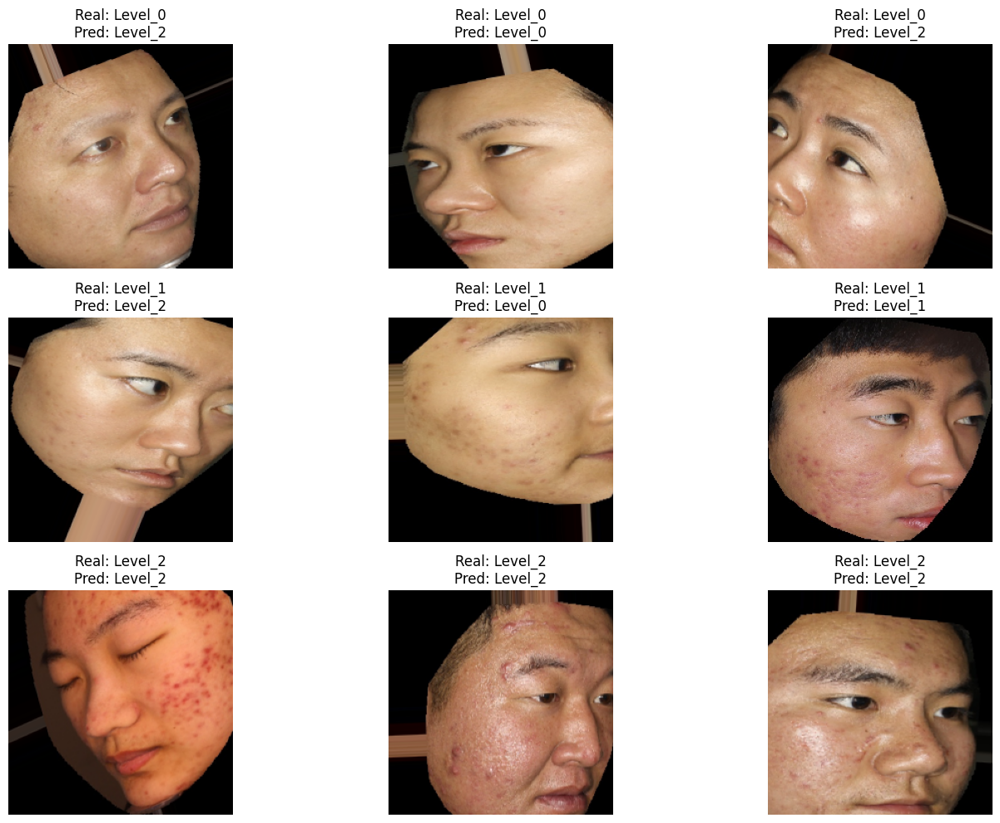

In [46]:
import os
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img

# Rutas de las carpetas de validación
base_dir = "/kaggle/working/DTTYV/validation"
# Ruta de la carpeta donde se guardará la imagen
output_dir = "/kaggle/working/Fotos/"
output_path = os.path.join(output_dir, "modelo2predicciones.png")

# Verificar si la carpeta existe, si no, crearla
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
    print(f"Carpeta creada: {output_dir}")
else:
    print(f"Carpeta ya existe: {output_dir}")

# Crear subplots como antes
fig, axes = plt.subplots(len(class_names), 3, figsize=(15, 10))

for i, class_name in enumerate(class_names):
    for j, (img_path, pred_label) in enumerate(selected_images[class_name]):
        img = load_img(img_path, target_size=(224, 224))  # Cargar imagen
        ax = axes[i, j]
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(f"Real: {class_name}\nPred: {class_names[pred_label]}")

# Ajustar diseño
plt.tight_layout()

# Guardar el plot como una imagen
fig.savefig(output_path, dpi=300)  # Guarda con alta resolución (300 DPI)

print(f"Gráfico guardado en: {output_path}")


### **Modelo EfficientNetB0**

In [58]:
import os
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping

# Cargar el modelo preentrenado EfficientNetB0 sin la capa superior
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Descongelar algunas capas del modelo base
for layer in base_model.layers[-10:]:
    layer.trainable = True

# Agregar capas superiores
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dense(3, activation='softmax')(x)

# Crear el modelo
model3 = Model(inputs=base_model.input, outputs=x)

# Compilar el modelo
model3.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Callbacks
callbacks = [
    ModelCheckpoint(
        filepath=os.path.join(checkpoint_dir, 'best_model3.keras'),
        monitor='val_accuracy',
        save_best_only=True,
        mode='max',
        verbose=1
    ),
    ReduceLROnPlateau(
        monitor='val_accuracy',
        factor=0.5,
        patience=5,
        mode='max',
        min_lr=1e-6,
        verbose=1
    ),
    EarlyStopping(
        monitor='val_accuracy',
        patience=10,
        restore_best_weights=True,
        verbose=1
    )
]

# Entrenamiento del modelo
history3 = model3.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=100,
    callbacks=callbacks
)


Epoch 1/100
106/106 ━━━━━━━━━━━━━━━━━━━━ 0s 777ms/step - accuracy: 0.5436 - loss: 0.9054
Epoch 1: val_accuracy improved from -inf to 0.32149, saving model to ./checkpoints/best_model3.keras
106/106 ━━━━━━━━━━━━━━━━━━━━ 177s 938ms/step - accuracy: 0.5445 - loss: 0.9040 - val_accuracy: 0.3215 - val_loss: 1.1013 - learning_rate: 1.0000e-04
Epoch 2/100
106/106 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step - accuracy: 0.7602 - loss: 0.5098
Epoch 2: val_accuracy did not improve from 0.32149
106/106 ━━━━━━━━━━━━━━━━━━━━ 46s 412ms/step - accuracy: 0.7603 - loss: 0.5096 - val_accuracy: 0.3191 - val_loss: 1.1333 - learning_rate: 1.0000e-04
Epoch 3/100
106/106 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step - accuracy: 0.8185 - loss: 0.4278
Epoch 3: val_accuracy improved from 0.32149 to 0.33866, saving model to ./checkpoints/best_model3.keras
106/106 ━━━━━━━━━━━━━━━━━━━━ 47s 420ms/step - accuracy: 0.8186 - loss: 0.4277 - val_accuracy: 0.3387 - val_loss: 16.7589 - learning_rate: 1.0000e-04
Epoch 4/100
106/106 ━━━━━━━━━━━

53/53 ━━━━━━━━━━━━━━━━━━━━ 6s 111ms/step - accuracy: 0.9755 - loss: 0.0902
Precisión en validacion: 98.22%


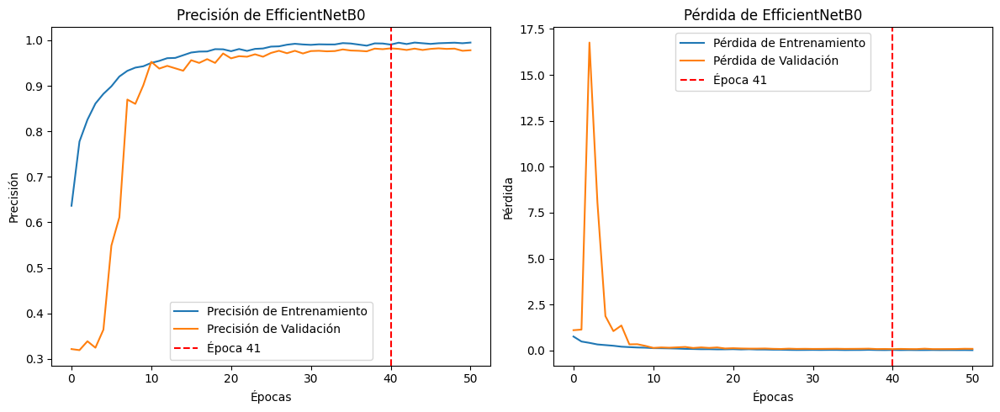

In [66]:
loss, accuracy = model3.evaluate(validation_generator)
print(f"Precisión en validacion: {accuracy * 100:.2f}%")
# Gráfica de precisión
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history3.history['accuracy'], label='Precisión de Entrenamiento')
plt.plot(history3.history['val_accuracy'], label='Precisión de Validación')
plt.axvline(x=41 - 1, color='red', linestyle='--', label=f'Época {41}')
plt.title('Precisión de EfficientNetB0')
plt.xlabel('Épocas')
plt.ylabel('Precisión')
plt.legend()

# Gráfica de pérdida
plt.subplot(1, 2, 2)
plt.plot(history3.history['loss'], label='Pérdida de Entrenamiento')
plt.plot(history3.history['val_loss'], label='Pérdida de Validación')
plt.axvline(x=41 - 1, color='red', linestyle='--', label=f'Época {41}')
plt.title('Pérdida de EfficientNetB0')
plt.xlabel('Épocas')
plt.ylabel('Pérdida')
plt.legend()

plt.tight_layout()
plt.show()

53/53 ━━━━━━━━━━━━━━━━━━━━ 14s 179ms/step


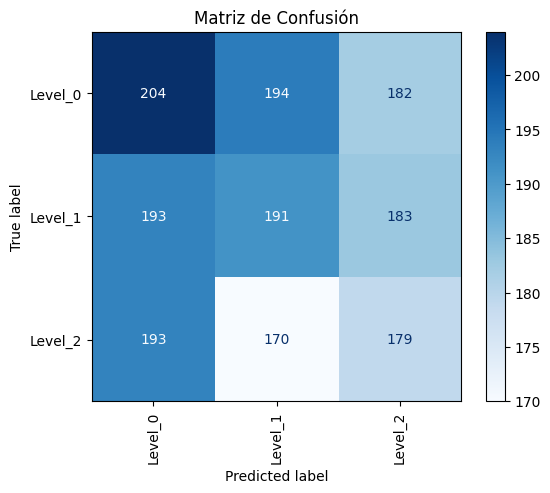

In [60]:
import numpy as np

# Obtener predicciones del modelo
y_pred = model3.predict(validation_generator)
y_pred_classes = np.argmax(y_pred, axis=1)  # Convertir a índices de clases

# Etiquetas verdaderas
y_true = validation_generator.classes

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Etiquetas de clase
class_labels = list(validation_generator.class_indices.keys())  # Nombres de las clases

# Generar matriz de confusión
conf_matrix = confusion_matrix(y_true, y_pred_classes)

# Visualizar la matriz de confusión
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=class_labels)
disp.plot(cmap='Blues', xticks_rotation='vertical')
plt.title('Matriz de Confusión')
plt.show()

In [61]:
from sklearn.metrics import classification_report
# Etiquetas verdaderas
y_true = validation_generator.classes  # Extrae etiquetas verdaderas del generador

# Predicciones del modelo
import numpy as np
y_pred_probs = model3.predict(validation_generator)  # Predicciones como probabilidades
y_pred = np.argmax(y_pred_probs, axis=1)  # Convierte probabilidades en etiquetas

# Ejemplo
print(classification_report(
    y_true,
    y_pred,
    labels=None,  # Puedes especificar etiquetas específicas si es necesario
    target_names=None,  # Opcional: nombres de las clases
    sample_weight=None,  # Pesos opcionales para las muestras
    digits=4,  # Precisión decimal
    output_dict=False,  # Cambia a True si quieres el resultado como un diccionario
    zero_division='warn'  # Cómo manejar divisiones por cero
))

53/53 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step
              precision    recall  f1-score   support

           0     0.3356    0.3414    0.3385       580
           1     0.3405    0.3333    0.3369       567
           2     0.3107    0.3118    0.3112       542

    accuracy                         0.3292      1689
   macro avg     0.3289    0.3288    0.3289      1689
weighted avg     0.3293    0.3292    0.3292      1689



53/53 ━━━━━━━━━━━━━━━━━━━━ 9s 103ms/step


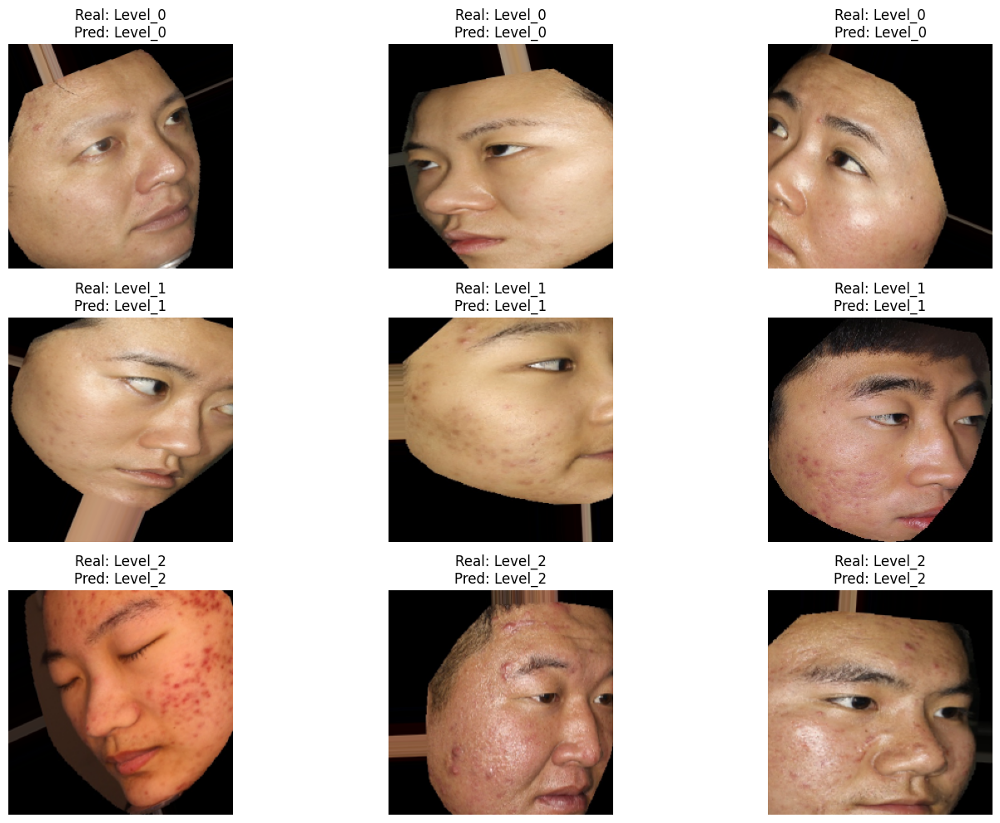

In [64]:
import os
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Rutas de las carpetas de validación
base_dir = "/kaggle/working/DTTYV/validation"
class_names = sorted(os.listdir(base_dir))  # Nombres de las carpetas (clases)

# Función para cargar imágenes
def load_images_and_labels(base_dir, class_names):
    images, labels, file_paths = [], [], []
    for label, class_name in enumerate(class_names):
        class_dir = os.path.join(base_dir, class_name)
        for img_name in os.listdir(class_dir):
            img_path = os.path.join(class_dir, img_name)
            images.append(img_path)
            labels.append(label)
            file_paths.append(img_path)
    return images, labels, file_paths

# Cargar imágenes y etiquetas verdaderas
image_paths, y_true, file_paths = load_images_and_labels(base_dir, class_names)

# Obtener predicciones del modelo
y_pred_probs = model3.predict(np.array([img_to_array(load_img(img_path, target_size=(224, 224))) / 255.0 for img_path in image_paths]))
y_pred = np.argmax(y_pred_probs, axis=1)

# Seleccionar 3 imágenes por clase
selected_images = {class_name: [] for class_name in class_names}
for img_path, true_label, pred_label in zip(image_paths, y_true, y_pred):
    if len(selected_images[class_names[true_label]]) < 3:
        selected_images[class_names[true_label]].append((img_path, pred_label))

# Graficar las imágenes
fig, axes = plt.subplots(len(class_names), 3, figsize=(15, 10))

for i, class_name in enumerate(class_names):
    for j, (img_path, pred_label) in enumerate(selected_images[class_name]):
        img = load_img(img_path, target_size=(224, 224))  # Cargar imagen
        ax = axes[i, j]
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(f"Real: {class_name}\nPred: {class_names[pred_label]}")

plt.tight_layout()
plt.show()


Carpeta ya existe: /kaggle/working/Fotos/
Gráfico guardado en: /kaggle/working/Fotos/modelo3predicciones.png


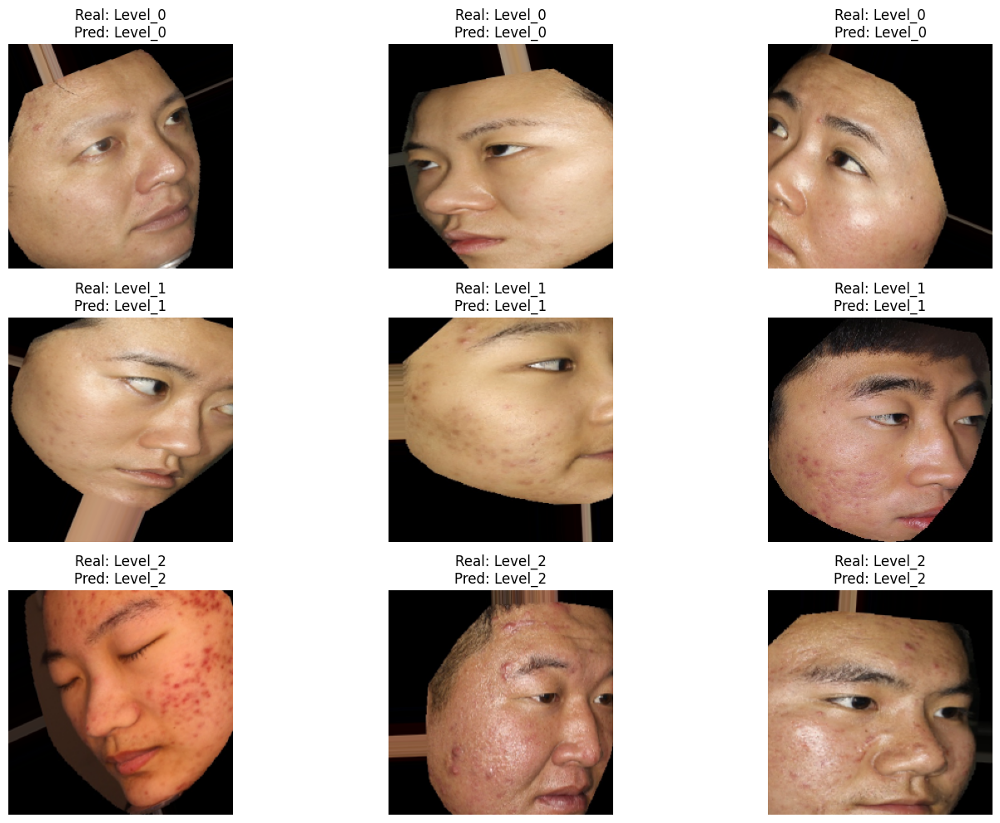

In [65]:
import os
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img

# Rutas de las carpetas de validación
base_dir = "/kaggle/working/DTTYV/validation"
# Ruta de la carpeta donde se guardará la imagen
output_dir = "/kaggle/working/Fotos/"
output_path = os.path.join(output_dir, "modelo3predicciones.png")

# Verificar si la carpeta existe, si no, crearla
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
    print(f"Carpeta creada: {output_dir}")
else:
    print(f"Carpeta ya existe: {output_dir}")

# Crear subplots como antes
fig, axes = plt.subplots(len(class_names), 3, figsize=(15, 10))

for i, class_name in enumerate(class_names):
    for j, (img_path, pred_label) in enumerate(selected_images[class_name]):
        img = load_img(img_path, target_size=(224, 224))  # Cargar imagen
        ax = axes[i, j]
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(f"Real: {class_name}\nPred: {class_names[pred_label]}")

# Ajustar diseño
plt.tight_layout()

# Guardar el plot como una imagen
fig.savefig(output_path, dpi=300)  # Guarda con alta resolución (300 DPI)

print(f"Gráfico guardado en: {output_path}")
